![](UFC_Banner.png)

# <center>Ultimate Fighter Championship Data Analysis</center>

#### <center>By Rohan Kasuganti and Savya Konkalmatt</center>

The Ultimate Fighter Championship (UFC) is an America Mixed Martial Arts promotion at the frontier of the sport. Since 1993, The UFC has hosted over 500 events, each of which has up to 20 fights. The fights are made and announced by matchmakers and the fighters are all members of the UFC roster. In the roster there are 8 weight classes for men and 4 weight classes for women, each weight class consisting of approximately 50 fighters. Fighters signed to the UFC typically have made a name for themselves in other combat sports or are elite prospects from smaller or regional MMA promotions, so the UFC has been able to boast the best of the best during its existance.

On a given fight night, the fights are made of about 5 fights on the undercard and 5 fights on the main card. The undercard typically consists of new signees and low ranked fights while the main card will include 3-4 mid-ranked fighters with 1-2 high profile bouts, also known as the main event. There is no restriction on which weight class must have a fight on card. Each of the fights consist of three 5 minute rounds (except the main event, which has five rounds) where the fight will continue until time runs out and the fight is determined by a decision by judges or the ref determines that one fighter has ceased to intelligently defend themselves. The ref's decsion can come from several different situations incuding a submission, knockout, or technical knockout.

The goal of this tutorial is to explore trends in UFC data based on logistical data and fight statistics, learn about which fighters are the best, and attempt to predict the outcome of fights based on historical data of the fighters.

# Libraries

The following are the libraries we used to do the data analysis in this tutorial. The first group represent the core libraries handling data manipulation and basic plotting. The second group are libraries that provide helpful functionality for the later analysis. The third group are the libraries associated with each direct statistical model we use in our analysis. Finally, the last group of libraries are used for the geographical analysis and plotting.

In [1]:
# Required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime

from pandas.api.types import is_numeric_dtype
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier
import statsmodels.api as sm

from geopy.geocoders import *
import folium
from folium import plugins
import plotly.express as px  
%matplotlib inline

# Datasets

The data we use in this tutorial can be located at https://www.kaggle.com/rajeevw/ufcdata. There are two primary data sets
that we utilized. The first is called data.csv and is the complete set of all the raw data. It includes every single variable and is the original source of all further analysis. However, there are some issues with the dataset: many of the variables are categorical (making immediate analysis difficult), and there are a significant number of NaNs. The missing data usually comes from the fact that, since each observation usually records the average of each stat across the fighter's career, their first fights do not have averages for each stat. This dataset is shown below, referenced in the code as df_raw:

In [2]:
df_raw = pd.read_csv("data.csv")
df_raw.head()

,R_fighter,B_fighter,Referee,date,location,Winner,title_bout,weight_class,no_of_rounds,B_current_lose_streak,...,R_win_by_KO/TKO,R_win_by_Submission,R_win_by_TKO_Doctor_Stoppage,R_wins,R_Stance,R_Height_cms,R_Reach_cms,R_Weight_lbs,B_age,R_age
0,Henry Cejudo,Marlon Moraes,Marc Goddard,2019-06-08,"Chicago, Illinois, USA",Red,True,Bantamweight,5,0.0,...,2.0,0.0,0.0,8.0,Orthodox,162.56,162.56,135.0,31.0,32.0
1,Valentina Shevchenko,Jessica Eye,Robert Madrigal,2019-06-08,"Chicago, Illinois, USA",Red,True,Women's Flyweight,5,0.0,...,0.0,2.0,0.0,5.0,Southpaw,165.10,167.64,125.0,32.0,31.0
2,Tony Ferguson,Donald Cerrone,Dan Miragliotta,2019-06-08,"Chicago, Illinois, USA",Red,False,Lightweight,3,0.0,...,3.0,6.0,1.0,14.0,Orthodox,180.34,193.04,155.0,36.0,35.0
3,Jimmie Rivera,Petr Yan,Kevin MacDonald,2019-06-08,"Chicago, Illinois, USA",Blue,False,Bantamweight,3,0.0,...,1.0,0.0,0.0,6.0,Orthodox,162.56,172.72,135.0,26.0,29.0
4,Tai Tuivasa,Blagoy Ivanov,Dan Miragliotta,2019-06-08,"Chicago, Illinois, USA",Blue,False,Heavyweight,3,0.0,...,2.0,0.0,0.0,3.0,Southpaw,187.96,190.50,264.0,32.0,26.0


The second dataset used is called preprocessed_data.csv. This dataset is the result of some data cleaning and preprocessing that the author of the dataset as a whole ran on the original raw data.csv. The primary differences are that non-numeric variables have been completely removed. Categorical variables have been replaced through one-hot encoding where possible, and variables like fighter names, dates, and locations have simply been removed entirely. In addition, NaN values have been completely removed (either with interpolation where possible, or simply dropping observations). Since the original dataset maintains data on variables like dates and locations, this data will be used for time and location-dependent analysis, as well as general EDA. Meanwhile, statistical modeling will make use of the processed dataset, which is referenced simply as df in the code and is shown below:

In [3]:
df = pd.read_csv("preprocessed_data.csv")
df.head()

,Winner,title_bout,no_of_rounds,B_current_lose_streak,B_current_win_streak,B_draw,B_avg_BODY_att,B_avg_BODY_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,...,weight_class_Women's Strawweight,B_Stance_Open Stance,B_Stance_Orthodox,B_Stance_Sideways,B_Stance_Southpaw,B_Stance_Switch,R_Stance_Open Stance,R_Stance_Orthodox,R_Stance_Southpaw,R_Stance_Switch
0,Red,True,5,0.0,4.0,0.0,9.200000,6.000000,0.200000,0.000000,...,0,0,1,0,0,0,0,1,0,0
1,Red,True,5,0.0,3.0,0.0,14.600000,9.100000,11.800000,7.300000,...,0,0,1,0,0,0,0,0,1,0
2,Red,False,3,0.0,3.0,0.0,15.354839,11.322581,6.741935,4.387097,...,0,0,1,0,0,0,0,1,0,0
3,Blue,False,3,0.0,4.0,0.0,17.000000,14.000000,13.750000,11.000000,...,0,0,0,0,0,1,0,1,0,0
4,Blue,False,3,0.0,1.0,0.0,17.000000,14.500000,2.500000,2.000000,...,0,0,0,0,1,0,0,0,1,0


Since the data is averaged based on each fight, it is important to include the statstics of the opponent ('opp') historical data since not all fights are the same length. The data includes many columns specifying types of attacks landed and attempted and is seperated in to grappling and striking sections. The striking data has averages Body, Clinch, Distance, Ground, Head, Leg, Knockdowns, and Significant Strikes and grappling data for Pass, Reverasals, Submissions, and Takedowns. A visual representation of some of these can be found here: https://www.theguardian.com/sport/ng-interactive/2016/jul/09/mixed-martial-arts-fighting-techniques-guide-ufc#:~:text=Boxing%2C%20Kickboxing%20and%20Muay%20Thai,and%20legs%20to%20throw%20strikes.

Fighters are represented by red and blue, by the color of their corners. In general, the red cornor is assigned to the side more notable and thus more favored to win. This is also observed in how the blue cornor, by custom, always walks out first. In title bouts, the current champion is always red and walks out second. Each row is a compilation of both fighter stats up to the the current fight. The columns contain complied average stats of all the fights previously. 

The data consists of logistics about the fight and data specific to each fighter. The data pertaining to the red fighter is prefixed with 'R_' and for the blue fighter 'B_'. The 'opp_' tag indicates data done by the opponent on the fighter. The target variable is 'Winner' which is the only column that tells you the outcome of the fight. The 

In [4]:
# Win rates of title and non-title fights based on color
title_df = df_raw.loc[df_raw['title_bout'] == True]
non_title_df = df_raw.loc[(df_raw['title_bout'] == False)]

print('The number of title fights: ', title_df.shape[0])
print('The number of non-title fights: ', non_title_df.shape[0])

print('Probability red fighter wins in title fight: ', title_df[title_df['Winner'] == 'Red'].shape[0]/title_df.shape[0])
print('Probability red fighter wins in a non-title fight: ', non_title_df[non_title_df['Winner'] == 'Red'].shape[0]/non_title_df.shape[0])

The number of title fights:  335
The number of non-title fights:  4809
Probability red fighter wins in title fight:  0.8029850746268656
Probability red fighter wins in a non-title fight:  0.6656269494697442


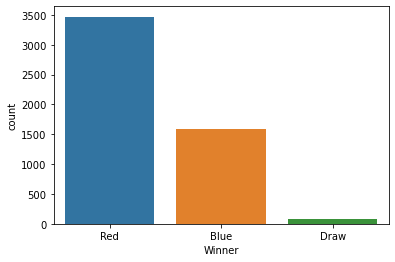

In [5]:
# Graph the instances of each winning corner
sns.countplot(x=df_raw['Winner'], data=df_raw);

# Exploratory Data Analysis

In the next section, we will be taking a look at a few interesting variables contained in the dataset to get an idea of exactly what information is contained. In addition, we will make a number of graphs showing the distributions of certain variables to see how these variables have both changed over time and how these items breakdown into their respective categories.

### Weight Classes

The following is a bar graph showing the different weight classes that fighters are a part of. This analysis looks at each _instance_ of a fighter of a certain weight class appearing in the table; it doesn't discriminate by the fighter itself. For example, if the entire dataset consists of 5 fights of the same two fighters of the same weight class, that weight class will appear 10 times in the graph below. This lets us take a look at which weight classes are displayed most commonly, instead of just which weight class most fighters belong to. As you can see, the majority of fights happen with fighters that are Lightweight or Welterweight, with the runner up being Middleweight.

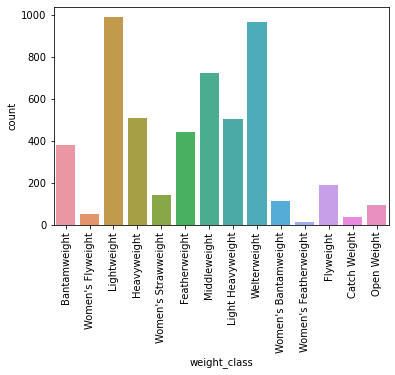

In [6]:
# Count the number of instances of each weight class in the dataset and graph them
plt.xticks(rotation=90)
sns.countplot(x=df_raw['weight_class'], data=df_raw);

### Ages

The next is a look at the ages of each fighter. Once again, this analysis counts every appearance of a certain age in the dataset, and doesn't distinguish between fighters themselves. The curve follows a relatively normal distribution, with a mean of 29.3 and a standard deviation of 4.1. 

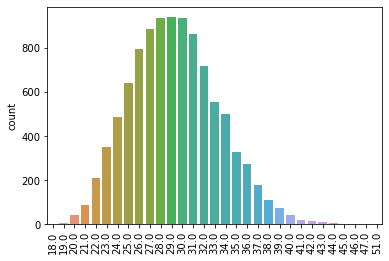

In [7]:
# Construct an array of every age that appears in the dataset
total = np.concatenate((df_raw['R_age'].values,df_raw['B_age'].values))

# Graph the distribution of ages
plt.xticks(rotation=90)
sns.countplot(total);

Now let's do a quick check to see if there is a relationship between age and the winner of a fight. If there was a significant advantage to being a certain age within the larger range of ages in the UFC dataset, then the distribution of the winners of fights should look different from the distribution of all fighters. Therefore, we can create a KDE plot of the ages of only the winners and compare that to a KDE plot of the ages of all fighters, shown below. 

As can be seen from the plot, there doesn't seem to be a huge difference in the distributions, which means there isn't a significantly higher chance of a fighter winning a fight just because they are younger or older. However, there still is a (very slightly) higher peak in the winners distribution than the other one, so winners do tend to be slightly more tightly clustered towards their mean age of 28.9 (instead of the mean of all fighters, whcih is 29.3). Granted, this difference is small, so it is difficult to say for sure whether age plays an important factor right away. Further reading on the topic of differentiating between distributions can be found on this University of Oregon page: http://homework.uoregon.edu/pub/class/es202/ztest.html

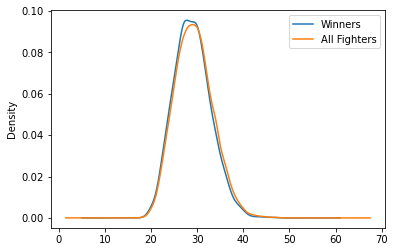

In [8]:
# Create a column entry of only the winners' ages
df_raw['Winner_age'] = [b_age if winner == 'Blue' else r_age 
                        for winner, b_age, r_age in 
                        zip(df_raw['Winner'], df_raw['B_age'], df_raw['R_age'])]

# Plot the distribution of winners and the distribution of every fighter
ax = df_raw['Winner_age'].plot.kde();
pd.Series(total).plot.kde(ax=ax);
ax.legend(["Winners", "All Fighters"]);

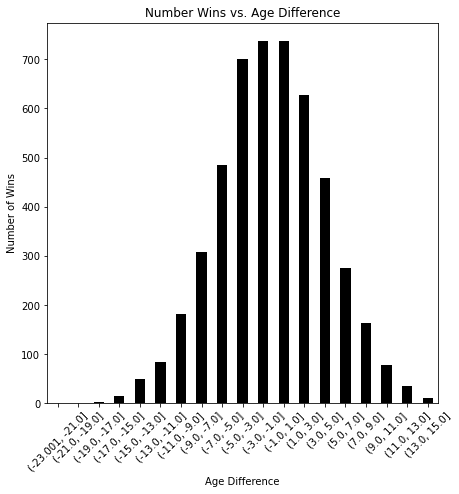

In [9]:
age_diff = pd.Series(name='age_diff', dtype='float64')
for row_index,row in df_raw.iterrows():
    a = row['R_age'] - row['B_age']
    
    if (row['Winner'] == 'Blue'):
        a = row['B_age'] - row['R_age']

    age_diff = age_diff.append(pd.Series(a))

age_diff_list = age_diff.tolist()

out = pd.cut(age_diff, bins=list(range(-23,17,2)), include_lowest=True)
ax = out.value_counts(sort=False).plot.bar(rot=0, color="k", figsize=(7,7))
plt.xticks(rotation='45')
plt.rc('xtick',labelsize=8)
plt.rc('ytick',labelsize=8)
plt.xlabel('Age Difference')
plt.ylabel('Number of Wins')
plt.title('Number Wins vs. Age Difference')
plt.show()

### Stance

Now we will perform a similar analysis, but this time on the Stance variable. First, we'd like to see the breakdown of stances by number (so that we can see which stances are the most common). The following bar graph shows that Orthodox is by far the most common stance, followed by Southpaw and then Switch.

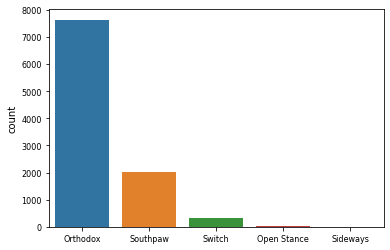

In [10]:
# Count the number of instances of each stance in the dataset and graph them
total = np.concatenate((df_raw['R_Stance'].values, df_raw['B_Stance'].values))
sns.countplot(total);

Now let's find out if any of these stances are somehow better than or more likely to beat specific other stances. To do this, we'll first construct a simplified dataframe that only contains the winning and losing stance for each fight:

In [11]:
# Create a table columns that display which stance won and which stance lost for each fight
stance = df_raw[['Winner', 'B_Stance', 'R_Stance']].copy()
stance['Win_Stance'] = [b_stance if winner == 'Blue' else r_stance 
                        for winner, b_stance, r_stance in 
                        zip(stance['Winner'], stance['B_Stance'], stance['R_Stance'])]
stance['Lose_Stance'] = [b_stance if winner == 'Red' else r_stance 
                         for winner, b_stance, r_stance in 
                         zip(stance['Winner'], stance['B_Stance'], stance['R_Stance'])]

# Only keep observations where the two fighters' stances were different
stance = stance[stance['Win_Stance'] != stance['Lose_Stance']].dropna()[['Win_Stance', 'Lose_Stance']]

stance.head()

,Win_Stance,Lose_Stance
1,Southpaw,Orthodox
3,Switch,Orthodox
11,Orthodox,Switch
15,Southpaw,Orthodox
18,Orthodox,Switch


Now we can calculate the pair-wise winning percentages for each set of stances. First, we will ignore any fights for which both fighters have the same stance, since that doesn't tell us anything useful about matchups. Second, we will ignore any stances that have fewer than 40 wins, since otherwise we won't have enough data to make a statistically significant conclusion. As can be seen from the winning percentages below, Southpaw seems to have a small advantage over Orthodox, whereas Switch seems to have a similar advantage over Southpaw. However, it should be noted that these advantages are well within the margin to just be noise, and more samples will need to be taken to be able to make any sort of strong claim.

In [12]:
# Iterate through each combination of stances
for win_stance in stance['Win_Stance'].unique():
    for lose_stance in stance['Lose_Stance'].unique():
        
        # Only examine observations where the stances are different
        if win_stance != lose_stance:
            # Calculate the wins and losses for each pair of stances
            w = len(stance[(stance['Win_Stance'] == win_stance) & (stance['Lose_Stance'] == lose_stance)].index)
            l = len(stance[(stance['Win_Stance'] == lose_stance) & (stance['Lose_Stance'] == win_stance)].index)
            
            # Only look at stances that have won more than 40 times, since otherwise don't have enough evidence
            if w < 30:
                break
            print(win_stance + " beat " + lose_stance + " in " + str(round(w/(w+l),2)) + "% of matches")

Southpaw beat Orthodox in 0.54% of matches
Southpaw beat Switch in 0.46% of matches
Switch beat Orthodox in 0.51% of matches
Switch beat Southpaw in 0.54% of matches
Orthodox beat Switch in 0.49% of matches
Orthodox beat Southpaw in 0.46% of matches


### Matches per Year

Now let's look at how the number of matches per year has changed over time. To do this, we will first convert the dataset's original "date" variable and convert these to datetime objects, which will make it easy to extract what year each fight occurred in. The resulting plot is shown below. As you can see, the number of fights per year (and, most likely, the general public's interest in UFC) started a steep climb in 2005 and kept climbing until 2014, where things started to level out.

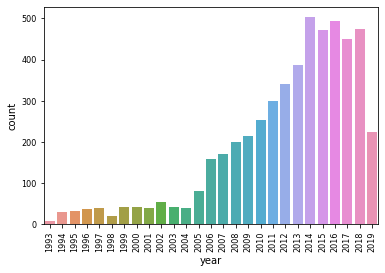

In [13]:
# Convert data to datetime objects and extract year information
df_raw['date'] = pd.to_datetime(df_raw['date'])
df_raw['year'] = df_raw['date'].dt.year

# Graph number of matches per year
plt.xticks(rotation=90)
sns.countplot(x=df_raw['year'], data=df_raw);

### Correlations

Another thing we can look at in the dataset is whether any of the variables are strongly correlated with each other. Not only can this provide us with useful insights on the data itself, but it might also alert us to problems that must be considered later on when running our statistical models. As can be seen in the list of printed correlations (and the heatmap), a number of variables have extremely high correlations. Many of these are pairs of \_att and \_landed variables. Some of the stats will list the number of strikes the fighter _attempted_, as well as how many they actually _landed_. So it makes sense that these are correlated (a fighter that attempts many leg strikes will probably also land many leg strikes). However, we aren't willing to drop either one of these columns since the combination can still provide new information (for example, some fighters may attempt many head strikes but land relatively few, meaning that they have low accuracy or might tend to blindly lash out). The rest of the closely correlated variables are usually a striking stat related to a SIG_STR_att or SIG_STR_landed, which simply refer to the number of significant strikes attempted or landed overall. Therefore, these correlations also make sense to be present in the dataset. Further reading on the subject of correlation heatmaps and interpreting them can be found in this article: https://towardsdatascience.com/better-heatmaps-and-correlation-matrix-plots-in-python-41445d0f2bec

R_avg_HEAD_att          R_avg_SIG_STR_att          0.978048
R_avg_LEG_landed        R_avg_LEG_att              0.976535
R_avg_opp_LEG_landed    R_avg_opp_LEG_att          0.973710
R_avg_CLINCH_landed     R_avg_CLINCH_att           0.969151
R_avg_opp_DISTANCE_att  R_avg_opp_SIG_STR_att      0.968623
B_avg_CLINCH_landed     B_avg_CLINCH_att           0.967093
R_avg_GROUND_att        R_avg_GROUND_landed        0.966829
B_avg_opp_SIG_STR_att   B_avg_opp_DISTANCE_att     0.966780
B_avg_opp_CLINCH_att    B_avg_opp_CLINCH_landed    0.966157
B_avg_GROUND_att        B_avg_GROUND_landed        0.964499
dtype: float64


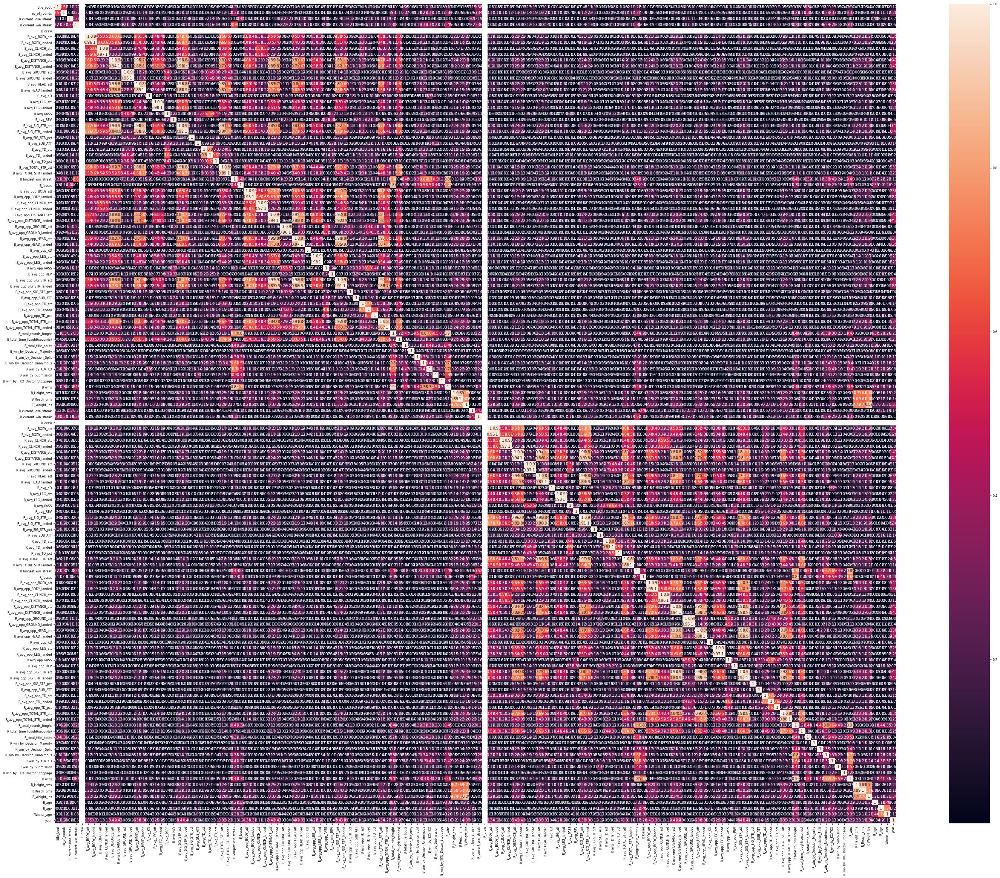

In [14]:
# Calculate correlation matrix for all variables in raw dataset
corr_matrix = df_raw.corr().abs()

# Unpack matrix and convert to list of pairs of variables that can be sorted and iterated over
correlations = corr_matrix.stack().sort_values(ascending=False)
correlations = correlations.iloc[df_raw.shape[1]-1::2]

# Print the ten largest correlations
print(correlations.head(10))

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(50, 40))
sns.heatmap(corr_matrix, annot=True);

# Trends Over Time

Moving on from pure EDA, we will now take a look at how specific variables have changed over time. As was shown in the Matches per Year section, there seems to be evidence of the presence of trends over time within the UFC. Coming up with the reasons for these changes will require domain expertise that we might simply not have, but we can at the very least notice trends that do pop up.

To do so, we will take a look at different variables and graph how their averages change over the period of time the dataset covers. We've preselected a number of variables from the original dataset that show interesting trends for the sake of this tutorial (these variables are listed below in the vars_of_interest collection). For each variable, we will calculate their average for each year, and construct a scatter plot of these numbers whcih will show how they change. We will also calculate the coefficient of determination for each (which is a measure of how strong the trend is), as well as the regression equation for examples with a strong enough trend.

As can be seen in the plots below, each of the variables we looked at show very different trends over time. The first three variables show clear, positive, and linear trends (in the case of B_avg_BODY_att, which is the number of body strikes that fighter B attempts, it is very reasonable to predict that the stat will increase by 0.435 every year. The next three variables (B_Weight_cms, B_Height_cms, and B_Reach_lbs, which represent the weight, height, and reach of fighter B respectively), on the other hand, all show a downward linear trend. It is not surprising that these variables share a trend, as all three of these variables should be strongly related physically. The downward nature of the trend is likely because of an evolution of the meta of the UFC itself; it seems to have shifted to favor smaller, lighter fighters as techniques and fighting styles have changed over time.

The final five variables all have much more unique distributions. B_avg_KD, for example, seems to stay relatively constant each year which implies that fighters aren't going for any more or fewer knockdowns at any point (outliers notwithstanding). The final four variables all have distributions that seem to be made up of two different curves that are separated by an inflection point (a phenomenon most obvious in the graph for no_of_rounds). This might be attributed to changes in the UFC itself; a major rule change was implemented in 2001, for example, which could explain why the curve changes so sharply around this year in the previously mentioned plot.

One final note is that the analysis here used a simple scatter plot and linear regression to identify trends. However, there are a significant number of analytic tools that can be used to study time-series data (particularly exponential smoothing and the Holt-Winters model). More information on these tools can be found at https://www.datacamp.com/community/tutorials/time-series-analysis-tutorial


B_avg_BODY_att:
coefficient of determination: 0.9311784993707244
B_avg_BODY_att = -867.6859373631675 + 0.4353922644458714 * year


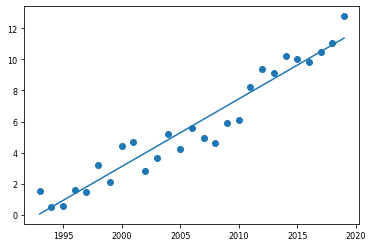


B_wins:
coefficient of determination: 0.7878340084454589
B_wins = -181.99335610522252 + 0.09168942297365934 * year


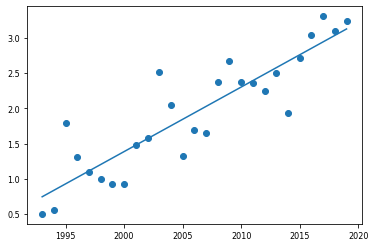


B_longest_win_streak:
coefficient of determination: 0.6773045317628448
B_longest_win_streak = -91.4298124344195 + 0.0462374396979068 * year


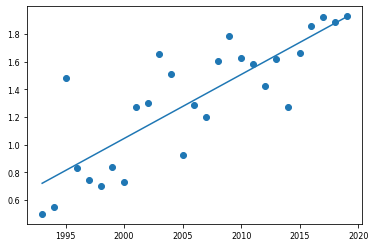


B_Weight_lbs:
coefficient of determination: 0.8712495312718904
B_Weight_lbs = 6446.375233158896 + -3.118563246053063 * year


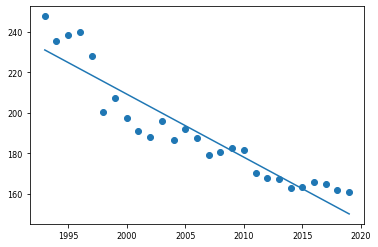


B_Height_cms:
coefficient of determination: 0.6835554005883554
B_Height_cms = 789.8905859243355 + -0.3034822853817451 * year


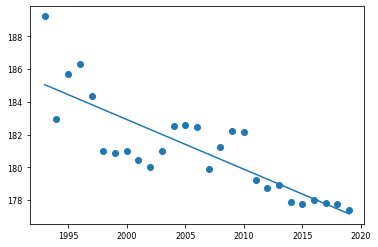


B_Reach_cms:
coefficient of determination: 0.2775468199714972


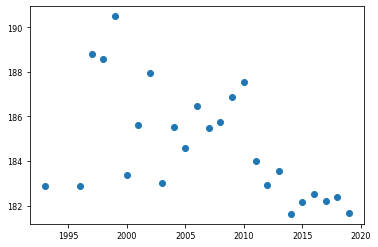


B_avg_KD:
coefficient of determination: 0.0015186190711523606


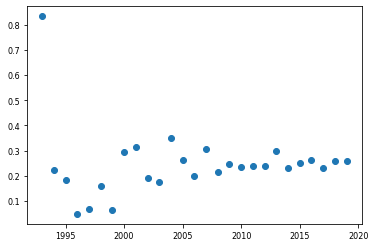


no_of_rounds:
coefficient of determination: 0.5085692500607459


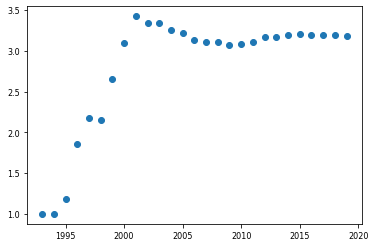


B_avg_GROUND_att:
coefficient of determination: 0.02924253368758667


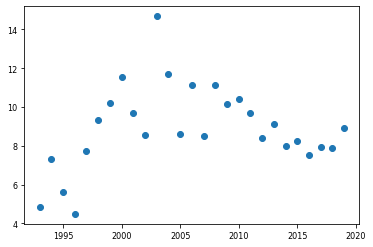


B_avg_opp_KD:
coefficient of determination: 0.4358777747643079


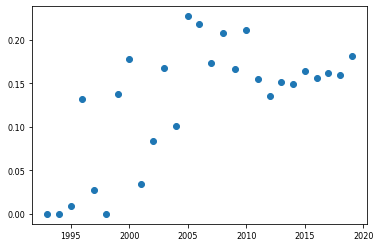


B_avg_SIG_STR_pct:
coefficient of determination: 0.48126750214746716


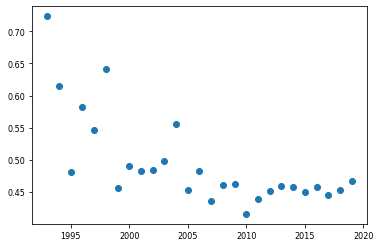

In [15]:
# Take a look at a couple interesting variables, and make scatter plots showing how their averages changed over time
# First 5 increase almost linearly over time. Next 3 decrease in a similar way. B_avg_KD stays pretty constant. The next
# couple have much weirder distributions, usually with two distinct curves separated by an inflection point. Also ran
# a simple linear regression on the ones that are clearly linear trends, showing their regression equation

# List of variables to look at
vars_of_interest = ['B_avg_BODY_att','B_wins', 'B_longest_win_streak', 
                    'B_Weight_lbs', 'B_Height_cms', 'B_Reach_cms', 
                    'B_avg_KD', 
                    'no_of_rounds', 
                    'B_avg_GROUND_att', 'B_avg_opp_KD', 'B_avg_SIG_STR_pct']

# Iterate through the list
for col in vars_of_interest:
    print("\n" + col + ":")

    # Calculate average of the stat for each year
    yrs = df_raw.groupby(df_raw['date'].dt.year)[col].mean().dropna()
    
    # Construct independent/dependent variables and fit a linear regression
    x = yrs.index.values.reshape(-1,1)
    y = yrs.values
    model = LinearRegression().fit(x, y)
    
    # Calculate the strength of the trend and, if strong enough, display the regression equation
    print('coefficient of determination:', model.score(x, y))
    if model.score(x, y) > .6:
        plt.plot(x, model.predict(x))
        print(col + " = " + str(model.intercept_) + " + " + str(model.coef_[0]) + " * year")

    # Construct and display the scatter plot
    plt.scatter(x, y)
    plt.show()

Some statistics demonstrate a clear correlation with time, but in observing the distributions, there is more to be found in the outliers in each year. The averages demonstrate a constant development in the fight game and how fighters in general are getting better as the sport grows. While the trends over the years of each statistic seem to vary by only a little year to year, there are outliers in each that suggest some fighters were exceedingly good at certain aspects of a fight. This may be related to striking, grappling, defence, or even longevity of their career. With this in mind, the debate about who the "goat" of MMA is, is one that is everalasting and constantly evolving. The advent of new fighters, fighting styles, and champions every year, keeps the conversation fresh and makes for an interesting search into which fighters stood out in each of their respective times or through the full history of the UFC. For this analysis, we will filter the data to include only fighters who have fought atleast 10 times in the UFC and are part of the Modern era of the UFC. The cutoff for this period is from UFC 28 onward which premiered no Novermber 17, 2000. Prior to this was the Pioneer era. During this period, the UFC's rules, fighters, and publicty were still dramatically evolving which lead to some significant outliers. Also, for the purposes of this search, we will be looking into the red side fighters as they are typically the more notable fighters and if a fighter is to be considered one of the best, has likely fought most fights as the red side.

Information about the eras of MMA can be found:
https://www.newsday.com/sports/mixed-martial-arts/ufc-hall-of-fame-1.26543626#:~:text=The%20UFC%20began%20its%20Hall,the%20Pioneer%20Era%20(before%20Nov.

Further discussion about the "goat" of UFC can be found (among many others):
https://mmasucka.com/2020/06/02/goat-of-mma/


In [16]:
data_filtered = df_raw[(df_raw['R_wins'] + df_raw['R_losses'] >= 10) & (df_raw['date'] > datetime.datetime(2000, 10, 17))] 

In [17]:
# Here are some examples of top 10 fighters in some statistics:

# Here are some top 10 fighters from the striking portion of the data.
print(data_filtered.sort_values(by=['R_avg_HEAD_landed'], ascending=False)[['R_fighter','R_avg_HEAD_landed']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(10))

# Here are some top 10 fighters in the grappling portion of the data.
print(data_filtered.sort_values(by=['B_avg_TD_landed'], ascending=False)[['R_fighter','R_avg_TD_landed']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(10))

# Here are some top 10 fighters for career statistics.
print(data_filtered.sort_values(by=['R_total_title_bouts'], ascending=False)[['R_fighter','R_total_title_bouts']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(10))

# Here are the top 10 fighters in the defensive perspectives.
print(data_filtered.sort_values(by=['R_avg_opp_HEAD_landed'], ascending=True)[['R_fighter','R_avg_opp_HEAD_landed']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(10))


                R_fighter  R_avg_HEAD_landed
86           Max Holloway          62.842105
425    Joanna Jedrzejczyk          61.400000
591           Evan Dunham          56.222222
617       Jessica Andrade          51.916667
347   Khabib Nurmagomedov          51.200000
1413         TJ Dillashaw          50.090909
352         Sergio Pettis          44.818182
424             Jose Aldo          44.454545
1730      Fabio Maldonado          44.000000
1943        Frankie Edgar          43.235294
             R_fighter  R_avg_TD_landed
304    Michel Prazeres         3.727273
4281   Andrei Arlovski         0.076923
3899         Jon Fitch         3.000000
2478  Rafael Dos Anjos         2.000000
154    Jeremy Stephens         0.931034
1616      TJ Dillashaw         1.400000
805        Demian Maia         2.307692
4242           BJ Penn         1.666667
3389        Clay Guida         3.285714
114      John Makdessi         0.000000
               R_fighter  R_total_title_bouts
3928       Randy Co

Now collecting several other stats from each category, we will consider the top fighters in each. To simplify this we will look at only the top 50 in each of the statistics and see which fighter, across all considered statistics, emerges the most for each category. Then with this, we will agregate it all to see who is comes out on top overall. The agregation will be done by finding and sorting the top 50 in each statistic and then summing the their reversed positions on the list. So rank 1 will gain 50 points, rank 2 will gain 49 points, etc.

In [18]:
# Sorting and trimming data from each statistic

# Striking
d1 = data_filtered.sort_values(by=['R_avg_TOTAL_STR_landed'], ascending=False)[['R_fighter','R_avg_TOTAL_STR_landed']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_TOTAL_STR_landed'], ascending=True).reset_index(drop=True);
d2 = data_filtered.sort_values(by=['R_avg_SIG_STR_landed'], ascending=False)[['R_fighter','R_avg_SIG_STR_landed']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_SIG_STR_landed'], ascending=True).reset_index(drop=True);
d3 = data_filtered.sort_values(by=['R_avg_KD'], ascending=False)[['R_fighter','R_avg_KD']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_KD'], ascending=True).reset_index(drop=True);
d4 = data_filtered.sort_values(by=['R_avg_BODY_landed'], ascending=False)[['R_fighter','R_avg_BODY_landed']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_BODY_landed'], ascending=True).reset_index(drop=True);
d5 = data_filtered.sort_values(by=['R_avg_HEAD_landed'], ascending=False)[['R_fighter','R_avg_HEAD_landed']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_HEAD_landed'], ascending=True).reset_index(drop=True);
d6 = data_filtered.sort_values(by=['R_avg_DISTANCE_landed'], ascending=False)[['R_fighter','R_avg_DISTANCE_landed']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_DISTANCE_landed'], ascending=True).reset_index(drop=True);
d7 = data_filtered.sort_values(by=['R_avg_LEG_landed'], ascending=False)[['R_fighter','R_avg_LEG_landed']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(10).head(51).sort_values(by=['R_avg_LEG_landed'], ascending=True).reset_index(drop=True);

# Grappling
d8 = data_filtered.sort_values(by=['R_avg_SUB_ATT'], ascending=False)[['R_fighter','R_avg_SUB_ATT']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_SUB_ATT'], ascending=True).reset_index(drop=True);
d9 = data_filtered.sort_values(by=['B_avg_TD_landed'], ascending=False)[['R_fighter','R_avg_TD_landed']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_TD_landed'], ascending=True).reset_index(drop=True);
d10 = data_filtered.sort_values(by=['R_avg_TD_pct'], ascending=False)[['R_fighter','R_avg_TD_pct']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_TD_pct'], ascending=True).reset_index(drop=True);
d11 = data_filtered.sort_values(by=['R_avg_PASS'], ascending=False)[['R_fighter','R_avg_PASS']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_PASS'], ascending=True).reset_index(drop=True);
d12 = data_filtered.sort_values(by=['B_avg_REV'], ascending=False)[['R_fighter','R_avg_REV']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_REV'], ascending=True).reset_index(drop=True);

# Career
d13 = data_filtered.sort_values(by=['R_total_title_bouts'], ascending=False)[['R_fighter','R_total_title_bouts']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_total_title_bouts'], ascending=True).reset_index(drop=True);
d14 = data_filtered.sort_values(by=['R_longest_win_streak'], ascending=False)[['R_fighter','R_longest_win_streak']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_longest_win_streak'], ascending=True).reset_index(drop=True);
d15 = data_filtered.sort_values(by=['R_total_rounds_fought'], ascending=False)[['R_fighter','R_total_rounds_fought']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_total_rounds_fought'], ascending=True).reset_index(drop=True);
d16 = data_filtered.sort_values(by=['R_wins'], ascending=False)[['R_fighter','R_wins']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_wins'], ascending=True).reset_index(drop=True);
d17 = data_filtered.sort_values(by=['R_total_title_bouts'], ascending=False)[['R_fighter','R_total_title_bouts']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_total_title_bouts'], ascending=True).reset_index(drop=True);

# Defensive
d18 = data_filtered.sort_values(by=['R_avg_opp_HEAD_landed'], ascending=True)[['R_fighter','R_avg_opp_HEAD_landed']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_opp_HEAD_landed'], ascending=False).reset_index(drop=True);
d19 = data_filtered.sort_values(by=['R_avg_opp_DISTANCE_landed'], ascending=True)[['R_fighter','R_avg_opp_DISTANCE_landed']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_opp_DISTANCE_landed'], ascending=False).reset_index(drop=True);
d20 = data_filtered.sort_values(by=['R_avg_opp_TOTAL_STR_landed'], ascending=True)[['R_fighter','R_avg_opp_TOTAL_STR_landed']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_opp_TOTAL_STR_landed'], ascending=False).reset_index(drop=True);
d21 = data_filtered.sort_values(by=['R_avg_opp_BODY_landed'], ascending=True)[['R_fighter','R_avg_opp_BODY_landed']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_opp_BODY_landed'], ascending=False).reset_index(drop=True);
d22 = data_filtered.sort_values(by=['R_avg_opp_SIG_STR_pct'], ascending=True)[['R_fighter','R_avg_opp_SIG_STR_pct']].drop_duplicates(subset=['R_fighter'], keep='first', inplace=False).head(51).sort_values(by=['R_avg_opp_SIG_STR_pct'], ascending=False).reset_index(drop=True);


In [19]:
# Now lets sum up all the ranks of each fighter and see who stands out!

best_striker = {}
data_sets = [d1, d2, d3, d4, d5, d6, d7]
for i,dataset in enumerate(data_sets):
    for row_index,row in dataset.iterrows():
        name = row['R_fighter']
        if name in best_striker: best_striker[name] = best_striker.get(name, 0) + row_index
        else: best_striker[name] = row_index
  
sorted(best_striker.values())     
sorted(best_striker, key=best_striker.get, reverse=True)[:10]

['Joanna Jedrzejczyk',
 'Max Holloway',
 'Jessica Andrade',
 'Fabio Maldonado',
 'Court McGee',
 'Junior Dos Santos',
 'TJ Dillashaw',
 'John Lineker',
 'Cub Swanson',
 'Frankie Edgar']

In [20]:
best_grappler = {}
data_sets = [d8, d9, d10, d11, d12]
for i,dataset in enumerate(data_sets):
    for row_index,row in dataset.iterrows():
        name = row['R_fighter']
        if name in best_grappler: best_grappler[name] = best_grappler.get(name, 0) + row_index
        else: best_grappler[name] = row_index
  
sorted(best_grappler.values())     
sorted(best_grappler, key=best_grappler.get, reverse=True)[:10]

['Georges St-Pierre',
 'Rani Yahya',
 'Gleison Tibau',
 'Demian Maia',
 'Matt Hughes',
 'Kurt Pellegrino',
 'Jon Fitch',
 'Mark Bocek',
 'Matthew Riddle',
 'BJ Penn']

In [21]:
best_career = {}
data_sets = [d13, d14, d15, d16, d17]
for i,dataset in enumerate(data_sets):
    for row_index,row in dataset.iterrows():
        name = row['R_fighter']
        if name in best_career: best_career[name] = best_career.get(name, 0) + row_index
        else: best_career[name] = row_index
  
sorted(best_career.values())     
sorted(best_career, key=best_career.get, reverse=True)[:10]

['Georges St-Pierre',
 'Jon Jones',
 'Demetrious Johnson',
 'Anderson Silva',
 'Randy Couture',
 'Frankie Edgar',
 'Tito Ortiz',
 'Matt Hughes',
 'Max Holloway',
 'Lyoto Machida']

In [22]:
best_defense = {}
data_sets = [d18, d19, d20, d21, d22]
for i,dataset in enumerate(data_sets):
    for row_index,row in dataset.iterrows():
        name = row['R_fighter']
        if name in best_defense: best_defense[name] = best_defense.get(name, 0) + row_index
        else: best_defense[name] = row_index
  
sorted(best_defense.values())     
sorted(best_defense, key=best_defense.get, reverse=True)[:10]

['Melvin Guillard',
 'Anderson Silva',
 'Anthony Johnson',
 'Matt Hughes',
 'Tito Ortiz',
 'Thiago Santos',
 'Andrei Arlovski',
 'Georges St-Pierre',
 'Evan Tanner',
 'Myles Jury']

In [23]:
best_overall = {}
data_sets = [d1, d2, d3, d4, d5, d6, d7, d8, d9, d10, d11, d12, d13, d14, d15, d16, d17, d18, d19, d20, d21, d22]
for i,dataset in enumerate(data_sets):
    for row_index,row in dataset.iterrows():
        name = row['R_fighter']
        if name in best_overall: best_overall[name] = best_overall.get(name, 0) + row_index
        else: best_overall[name] = row_index
  
sorted(best_overall.values())     
sorted(best_overall, key=best_overall.get, reverse=True)[:25]

['Georges St-Pierre',
 'Jon Jones',
 'Demetrious Johnson',
 'Anderson Silva',
 'Matt Hughes',
 'Frankie Edgar',
 'Max Holloway',
 'Tito Ortiz',
 'Joanna Jedrzejczyk',
 'Cain Velasquez',
 'Lyoto Machida',
 'Michael Bisping',
 'Randy Couture',
 'Andrei Arlovski',
 'Melvin Guillard',
 'Junior Dos Santos',
 'Chuck Liddell',
 'TJ Dillashaw',
 'Demian Maia',
 'BJ Penn',
 'Josh Koscheck',
 'Jessica Andrade',
 'Khabib Nurmagomedov',
 'Vitor Belfort',
 'Tony Ferguson']

With this organization method, we come up with a list of statistically the best 25 fighters in the UFC's modern era. Though this is not a perfect analysis since many factors go into a fight, this list accurately names many of the most notable fighters in the UFC history. Especcially with the top 4, Georges St-Pierre, Jon Jones, Demetrious Johnson, and Anderson Silva, there are many people that come into the "goat" discussion, but these four are the ones that any new name in the discussion must rival. As can be seen in the link perviously noted: https://mmasucka.com/2020/06/02/goat-of-mma/. Many names can also be cross identified in the UFC Hall of Fame found here: https://www.ufc.com/honors/ufc-hall-of-fame.

# Geographical Analysis

### Data Collection

The raw dataset has information on the city in which each individual UFC fight took place, which lets us do an overall analysis of where most UFC fights take place. We start with trying to map each of these fights individually by using each city's latitude and longitude to plot them on a map. This was done originally by using Nominatim, a free API that returns geographical information when provided an address. To avoid overuse of this free resource, we made API calls for each unique location in the dataset (temporarily storing this information in a Python dictionary), converting this data to a Pandas dataframe, and writing this dataframe to the location_map.csv so that the information can simply be referenced from there. This process is written out in the commented code below. 

After the original API call process described above, subsequent runs of this notebook can simply use the previously constructed CSV for location information. By referencing the CSV, latitude and longitude data can be sourced for and added to each observation in the dataset, shown below:

In [24]:
# Code for grabbing latitude and longitude for each observation (commented code originally uses API call to produce
# information, but this data was saved to a CSV and code now reads from this CSV)

# Construct a simplified dataframe that will contain only date and location information
df_geo = df_raw[['date', 'location']].copy()

df_geo['Lat'] = "0"
df_geo['Long'] = "0"

# Construct dictionary of locations to lat/long tuples using API calls
# geolocator = Nominatim(user_agent="320 City Analysis")
# loc_map = {}
# for loc in df_geo['location'].unique():
#     result = geolocator.geocode(loc)
#     if result:
#         loc_map[loc] = (result.point[0], result.point[1])

# Convert dictionary to dataframe df_locs that can be written to drive for storage
# [lat, long] = list(map(list, zip(*list(loc_map.values()))))
# data = {'Location':list(loc_map.keys()), "Lat":lat, "Long":long}
# df_locs = pd.DataFrame(data)

# Write df_locs to a CSV
# df_new.to_csv(path_or_buf = "location_map.csv")

# Read the location mapping from CSV into dataframe
df_locs = pd.read_csv("location_map.csv")[['Location', 'Lat', 'Long']].copy()

# Assign lat and long data
df_geo['Lat'] = [df_locs.loc[df_locs['Location'] == loc, 'Lat'].iloc[0] for loc in df_geo['location']]
df_geo['Long'] = [df_locs.loc[df_locs['Location'] == loc, 'Long'].iloc[0] for loc in df_geo['location']]

df_geo

,date,location,Lat,Long
0,2019-06-08,"Chicago, Illinois, USA",41.875562,-87.624421
1,2019-06-08,"Chicago, Illinois, USA",41.875562,-87.624421
2,2019-06-08,"Chicago, Illinois, USA",41.875562,-87.624421
3,2019-06-08,"Chicago, Illinois, USA",41.875562,-87.624421
4,2019-06-08,"Chicago, Illinois, USA",41.875562,-87.624421
...,...,...,...,...
5139,1993-11-12,"Denver, Colorado, USA",39.739236,-104.984862
5140,1993-11-12,"Denver, Colorado, USA",39.739236,-104.984862
5141,1993-11-12,"Denver, Colorado, USA",39.739236,-104.984862
5142,1993-11-12,"Denver, Colorado, USA",39.739236,-104.984862


### Heatmap
Now that we have latitude and longitude information for each observation, we can make a heatmap showing where all the fights in UFC history have taken place (which is pictured below). However, there is a problem with the heatmap: the map gets "hotter" when multiple points are next to each other, but not when they're overlaid. Since most of the location data comes in the form of repeat cities, this makes it difficult to see which cities actually have a high density of fights. For example, many UFC fights are held in Las Vegas, Nevada, but the map only shows one point for the entire set of fights happening there, which underrepresents how many fights take place there.

In [25]:
# Function to overlay a heatmap on the provided map using data in the provided dataframe
def heat_map(m, df):
    # convert to (n, 2) nd-array format
    leadsArr = df[['Lat', 'Long']].to_numpy()
    
    # plot heatmap
    m.add_child(plugins.HeatMap(leadsArr, radius=15))
    
    return m

# Construct a map and overlay the heatmap
m = folium.Map([df_geo['Lat'].mean(), df_geo['Long'].mean()], zoom_start=3)
m = heat_map(m, df_geo)

m

### Fights by Country

Instead of using a heatmap to identify where the majority of fights are happening, we can use a bar graph to display this data in a raw format. The following is a graph showing how many fights occur in each country listed in the dataset. As you can see, the US has the most fights by a significant margin (since the UFC is primarily popular in the US as opposed to other countries).

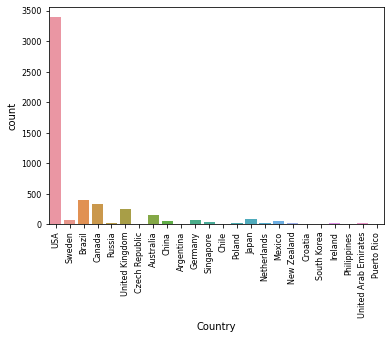

In [26]:
# Iterate through every observation in the set
for index, row in df_geo.iterrows():
    # Split up the location record into city, state, and country where possible
    parts = row['location'].split(',')

    df_geo.loc[index, 'Country'] = parts[-1].strip()
    df_geo.loc[index, 'City'] = parts[0].strip()
    if len(parts) == 3:
        df_geo.loc[index, 'State'] = parts[1].strip()

# Construct the count plot grouped by country
plt.xticks(rotation=90)
sns.countplot(x=df_geo['Country'], data=df_geo);

### Fights by State

Now that we've identified that the US is the country with the most fights, let's see exactly where these fights are happening. To do this, we can select all of the observations that are stated to take place in the US and group by state, which will give us a table of the number of fights taking place in each state. One caveat here is that the library being used in the next step requires the input table to use state's abbreviations instead of the state's name itself. As a result, we convert each state's name to its abbreviation by referencing the state_abbreviations.csv file that we created as a reference for this specific task. The final table can be seen below:

In [27]:
# Select all observations that occurred in the US and group by state
usa_fights = df_geo[df_geo['Country'] == "USA"]
counts = usa_fights.groupby('State').count()[['date']].rename(columns={'date': 'Count'}).reset_index()

# Convert all state names in the table to their abbreviations
df_abbrevs = pd.read_csv("state_abbreviations.csv")[['State', 'Abbreviation']].copy()
counts['State'] = [df_abbrevs.loc[df_abbrevs['State'] == state, 'Abbreviation'].iloc[0] 
                    if state in df_abbrevs['State'].values else state 
                    for state in counts['State']]
counts.head()

,State,Count
0,AL,46
1,AZ,50
2,CA,303
3,CO,107
4,CT,41


Now that we have counts for the number of fights by state, we can plot this data as a heatmap. To do this, we used the Choropleth library, which simply takes in the table defineed above and returns an interactive map of which states have the most data points. As you can see, Nevada is the clear winner (since a huge number of UFC fights happen in Las Vegas). Nevada is followed by California, Texas, and New Jersey.

In [28]:
# Construct the heatmap and display
fig = px.choropleth(counts,  
                    locations="State",  
                    color="Count",  
                    hover_name="State", 
                    locationmode = 'USA-states')

fig.update_layout(
    title_text = 'UFC Fights by State', 
    geo_scope='usa', 
)

fig.show()

# OLS to Predict Winner

Now that we've taken a good look at the data we have (including different variables' distributions, trends over time, and geographical analysis), let's try to use the data we have to predict the winner of an invidual fight. A quick note: up until now, we've been using df_raw, which refers to the original data.csv dataset. But for the OLS, we will be using df, which refers to the preprocessed.csv. This allows us to take advantage of the fact that the dataset has already been cleaned up to a degree (which is discussed in more detail in the __Datasets__ section), which makes working with the data a little bit easier.

However, one small manipulation still has to be done. There are exactly two variables left that aren't numerical: Winner, which refers to the winning corner of the right, and title_bout, which refers to whether or not the fight in question was a title bout. To function in the models we will use, these need to be transformed to numerical data. Therefore, we will be converting the "Winner" column to the "Blue_Wins" column, and will be using a 1 to represent that the blue corner did indeed win. Similarly, we will convert all True values in the "title_bout" column to a 1, and all False values to a 0.

In [29]:
# Encode "Winner" and "title_bout" as numerical data
df = df.rename(columns={'Winner': 'Blue_Wins'})
df['Blue_Wins'] = [1 if winner == 'Blue' else 0
                   for winner, in zip(df['Blue_Wins'])]

df['title_bout'] = [1 if title_bout else 0
                    for title_bout in zip(df['title_bout'])]

df

,Blue_Wins,title_bout,no_of_rounds,B_current_lose_streak,B_current_win_streak,B_draw,B_avg_BODY_att,B_avg_BODY_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,...,weight_class_Women's Strawweight,B_Stance_Open Stance,B_Stance_Orthodox,B_Stance_Sideways,B_Stance_Southpaw,B_Stance_Switch,R_Stance_Open Stance,R_Stance_Orthodox,R_Stance_Southpaw,R_Stance_Switch
0,0,1,5,0.0,4.0,0.0,9.200000,6.000000,0.200000,0.000000,...,0,0,1,0,0,0,0,1,0,0
1,0,1,5,0.0,3.0,0.0,14.600000,9.100000,11.800000,7.300000,...,0,0,1,0,0,0,0,0,1,0
2,0,1,3,0.0,3.0,0.0,15.354839,11.322581,6.741935,4.387097,...,0,0,1,0,0,0,0,1,0,0
3,1,1,3,0.0,4.0,0.0,17.000000,14.000000,13.750000,11.000000,...,0,0,0,0,0,1,0,1,0,0
4,1,1,3,0.0,1.0,0.0,17.000000,14.500000,2.500000,2.000000,...,0,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3587,0,1,1,0.0,1.0,0.0,1.000000,1.000000,0.000000,0.000000,...,0,0,0,0,1,0,0,0,1,0
3588,0,1,1,0.0,1.0,0.0,0.000000,0.000000,1.000000,1.000000,...,0,0,1,0,0,0,0,1,0,0
3589,0,1,1,0.0,2.0,0.0,0.500000,0.500000,0.000000,0.000000,...,0,0,1,0,0,0,0,0,1,0
3590,0,1,1,0.0,1.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0,0,1,0,0,0,0,0,1,0


Now, we can get into the OLS regression itself. This regression model will try to predict the value in the "Blue_Wins" column we created above; a result of a 1 will predict a blue corner win, while a result of 0 will predict a red corner win (since we're using a regression model for a classification problem, we will convert the actual numerical result to one of these binary classifications later). The most important question here is what variables to put into the model. Below are two sets of variables that have been found to give decent results(identified by first starting with a large number of variables and cutting out the ones that were the most insignificant). The set of variables titled "alternate_cols" is actually a superset of the variables currently being used in the regression, and has slightly better performance at the cost of using more than two times as many features.

The set of variables goes through a train/test split at a size of a third, so that two thirds of the processed dataset is used to train the model. The results of this training are shown below. The OLS has an adjusted R-squared of 0.382, which isn't an exceptional value. However, UFC matches are complicated and there are many factors that go into the winner of a match. Therefore, it is unlikely that we will be able to train a model with very high accuracy, but we can still try to make a model that makes decent predictions.

While this OLS model is relatively simple, OLS models can take advantage of significant feature engineering to handle much more complicated datasets. For further reading on this, check out https://realpython.com/linear-regression-in-python/

In [30]:
# Identify dependent variable
YVar = df[["Blue_Wins"]]

# Identify variables to be used in the regression
cols = ['B_avg_BODY_landed', 'B_avg_HEAD_landed', 'B_avg_TD_att', 'B_avg_TOTAL_STR_landed', 'B_age', 'R_age']

# Alternative set of variables for regression (more features for better performance)
# alternate_cols = ['B_avg_BODY_landed', 'B_avg_HEAD_landed', 'B_avg_TD_att', 'B_avg_TOTAL_STR_landed', 
#                   'B_avg_opp_BODY_att', 'B_avg_opp_HEAD_landed', 'B_avg_opp_LEG_landed', 
#                   'B_avg_opp_SIG_STR_att', 'B_avg_opp_TOTAL_STR_att', 'R_avg_TD_att', 'R_avg_opp_GROUND_att', 
#                   'R_avg_opp_SIG_STR_landed', 'B_age', 'R_age']

# Construct dataset for independent variables
XVar = df[cols]

# Create a train/test split
X_train, X_test, y_train, y_test = train_test_split(XVar, YVar, test_size=0.33, random_state=42)

# Fit the model and print results
LinearModel = sm.OLS(y_train, X_train, missing='drop').fit()
print(LinearModel.summary())

                                 OLS Regression Results                                
Dep. Variable:              Blue_Wins   R-squared (uncentered):                   0.384
Model:                            OLS   Adj. R-squared (uncentered):              0.382
Method:                 Least Squares   F-statistic:                              248.9
Date:                Mon, 21 Dec 2020   Prob (F-statistic):                   7.56e-248
Time:                        09:59:34   Log-Likelihood:                         -1532.6
No. Observations:                2406   AIC:                                      3077.
Df Residuals:                    2400   BIC:                                      3112.
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
                             coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------

Now let's see exactly how well the model did. We first feed the test training set into the model to make predictions. Then, since we used a regression model instead of a classification model, we need to convert these results back into solutions for the original classification model. To do this, we simply compare each returned value to the mean of the resulting data (multipled by a factor of 1.5, the value for which was determined experimentally with a validation dataset, to account for bias in the answer distribution). These prediction results can then be compared to the correct test results to determine how many true/false positive/negative classifications the model made.

As can be seen in the confusion matrix below, the model made 342 + 44 = 386 total incorrect classifications and 800 correct classifications, giving it about a 67.5% correct classification rate, which isn't bad! We can also tell that the model predicted more negative results than positive, which makes sense as a result of both the data itself and the bias factor included.

In [31]:
# Use the model to make predictions for the test set, and convert back to binary classification problem
y_pred = LinearModel.predict(X_test)
y_pred = np.array([0 if y < y_pred.mean()*1.5 else 1 for y in y_pred])

# Reformat data
y_test = y_test.values.ravel()

# Construct confusion matrix and output results
c_matrix = confusion_matrix(y_test, y_pred)
print("Confusion matrix:\n" + str(c_matrix))

print("\nNumber of incorrect classifications: " + str(c_matrix[0][1] + c_matrix[1][0]))
print("Number of classifications total: " + str(c_matrix.sum()))

Confusion matrix:
[[747  44]
 [342  53]]

Number of incorrect classifications: 386
Number of classifications total: 1186


# Random Forest to Predict Winner

Let's try to use another machine learning model. This time, we'll use a random forest classifier to try to predict who will win a given fight. We start off by doing a train/test split just like we did for the OLS. For the random forest, we will use 50 estimators (which seemed like a decent number of estimators to use based on the results of a previously run validation testset). The model is then fit to the training data, and predictions are made. 

This time, no transformation has to be made to the result, since the random forest is acting as a pure binary classifier. According to the confusion matrix, the model made 286 + 124 = 410 incorrect predictions out of 1186 total classifications for an accuracy of about 65%, which is just slightly worse than the OLS model. However, these are still pretty good results (especially considering there's no use of a bias factor in the random forest; these results are entirely the result of the model). Interestingly, this classifier had more false positives than true positives, which meansa it is too prone to predicting that the blue corner will win over the red corner. 

Random forests are a mature and frequently used model for simple and more complicated classification problems. The following is a (somewhat long) deep dive into the concept of what a random forest is, how it is used, and where it can be optimized: https://arxiv.org/pdf/1407.7502.pdf

In [32]:
# Create a train/test split of 1/3
X_train, X_test, y_train, y_test = train_test_split(XVar, YVar, test_size=0.33, random_state=42)

# Train the model and make predictions for the test dataset
clf = RandomForestClassifier(n_estimators=50)
clf = clf.fit(X_train, y_train.values.ravel())
y_pred = clf.predict(X_test)

# Output the results of the fit 
print("Confusion matrix:\n" + str(confusion_matrix(y_test.values.ravel(), y_pred)))

print("\nNumber of incorrect classifications: " + str(((np.array(y_pred)-np.array(y_test.values.ravel()))**2).sum()))
print("Number of classifications total: " + str(y_pred.shape[0]))

Confusion matrix:
[[667 124]
 [286 109]]

Number of incorrect classifications: 410
Number of classifications total: 1186


# Conclusion and Further Exploration
 
The sport of MMA is an intricate battle between two people, each extremely talented in whatever discipline they come from. This sport has been growing at an incredible rate and constantly evolving. As a young sport, the data we looked into gave a lot to work with and explore. Using what we learned in this class, CMSC320, we were able to learn and demonstrate things about the data. The goal of this tutorial was to learn about the UFC, its fighters, and the fights happening in the future. While we found it extremely difficult to predict a fight better than the color of the fighter, we recognize that there are fine details in each fight that can be used for this purpose. Hopefully this tutorial gave some unique insights that aren't readily obvious to the casual or more passionate fan of the sport. 

Though it is a young sport, there is still tons of infomation to explore. Some of our analyses and explorations only considered a subsection of the data and some missed important information by generalizing everything. Some ideas we didn't get to fully explore are the comparision of fighters statistics witht their opposition statistics. There are certainly many relationships to be made beyond the present data in classification of fighter, stylistic match ups, and as always the discussion of the greatest of all time. We hope this tutorial revealed how intricate this sport is and what it has to hold for the future. Thank you for reading! 